### Downloading the base dataset

In [ ]:
! pip install roboflow

- YoloV5

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="Pz7IcrOZHqCxqVSb32vs")
project = rf.workspace("dronecv").project("mineguard-thermal")
version = project.version(15)
dataset = version.download("yolov5")

- YoloV7

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="Pz7IcrOZHqCxqVSb32vs")
project = rf.workspace("dronecv").project("mineguard-thermal")
version = project.version(15)
dataset = version.download("yolov7")

- YoloV8

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="Pz7IcrOZHqCxqVSb32vs")
project = rf.workspace("dronecv").project("mineguard-thermal")
version = project.version(15)
dataset = version.download("yolov8")

- YoloV11

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="Pz7IcrOZHqCxqVSb32vs")
project = rf.workspace("dronecv").project("mineguard-thermal")
version = project.version(15)
dataset = version.download("yolov11")

- Detectron2

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="Pz7IcrOZHqCxqVSb32vs")
project = rf.workspace("dronecv").project("mineguard-thermal")
version = project.version(15)
dataset = version.download("coco")


### Training YoloV5

- Installing

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

In [ ]:
!pip uninstall protobuf==4.21.2
!pip install protobuf==3.20.3

In [ ]:
%cd yolov5

In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

- Training

In [ ]:
# train yolov5s on custom data for 50 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 50 --data ../MineGuard-Thermal-15/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
     32/49     2.15G    0.0392    0.0134         0        56       416:  15% 20/134 [00:05<00:29,  3.92it/s]/content/yolov5/train.py:326: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     32/49     2.15G   0.03901    0.0137         0        71       416:  16% 21/134 [00:05<00:33,  3.42it/s]/content/yolov5/train.py:326: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     32/49     2.15G   0.03895   0.01385         0        67       416:  16% 22/134 [00:05<00:31,  3.50it/s]/content/yolov5/train.py:326: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     32/49     2.1

- Validating and Testing

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

In [ ]:
%ls runs/train/yolov5s_results7/weights

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results7/weights/best.pt --img 416 --conf 0.4 --source ../MineGuard-Thermal-15/test/images

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

- Export train weights for future use

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results7/weights/best.pt /content/gdrive/My\ Drive

### Training YoloV7

- Install dependencies

In [ ]:
# Download YOLOv7 repository and install requirements
!git clone https://github.com/WongKinYiu/yolov7
%cd yolov7
!pip install -r requirements.txt

- Training

In [ ]:
# run this cell to begin training
%cd /content/yolov7
!python train.py --batch 16 --epochs 55 --data {dataset.location}/data.yaml --weights '' --device 0

- Evaluation

In [ ]:
# Run evaluation
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.1 --source {dataset.location}/test/images

- Inference

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
limit = 10000 # max images to print
for imageName in glob.glob('/content/yolov7/runs/detect/exp/*.jpg'): #assuming JPG
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1

### Training YoloV8

- Installing

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.2.103 -q

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

- Training

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data=MineGuard-Thermal-15/data.yaml epochs=50 imgsz=800 plots=True

In [10]:
HOME = 'content'

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/confusion_matrix.png', width=600)

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

- Validation

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

- Inference

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

In [ ]:
import glob
from IPython.display import Image, display

# Define the base path where the folders are located
base_path = '/content/runs/detect/'

# List all directories that start with 'predict' in the base path
subfolders = [os.path.join(base_path, d) for d in os.listdir(base_path)
              if os.path.isdir(os.path.join(base_path, d)) and d.startswith('predict')]

# Find the latest folder by modification time
latest_folder = max(subfolders, key=os.path.getmtime)

image_paths = glob.glob(f'{latest_folder}/*.jpg')[:3]

# Display each image
for image_path in image_paths:
    display(Image(filename=image_path, width=600))
    print("\n")

### Training YoloV11

- Installing

In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
%pip install "ultralytics<=8.3.40" supervision roboflow
import ultralytics
ultralytics.checks()

- Training

In [5]:
%cd /content

!yolo task=detect mode=train model=yolo11s.pt data=MineGuard-Thermal-15/data.yaml epochs=50 imgsz=640 plots=True

/content
100% 18.4M/18.4M [00:00<00:00, 126MB/s] 
New https://pypi.org/project/ultralytics/8.3.49 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=MineGuard-Thermal-15/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, re

In [ ]:
!ls {HOME}/runs/detect/train/

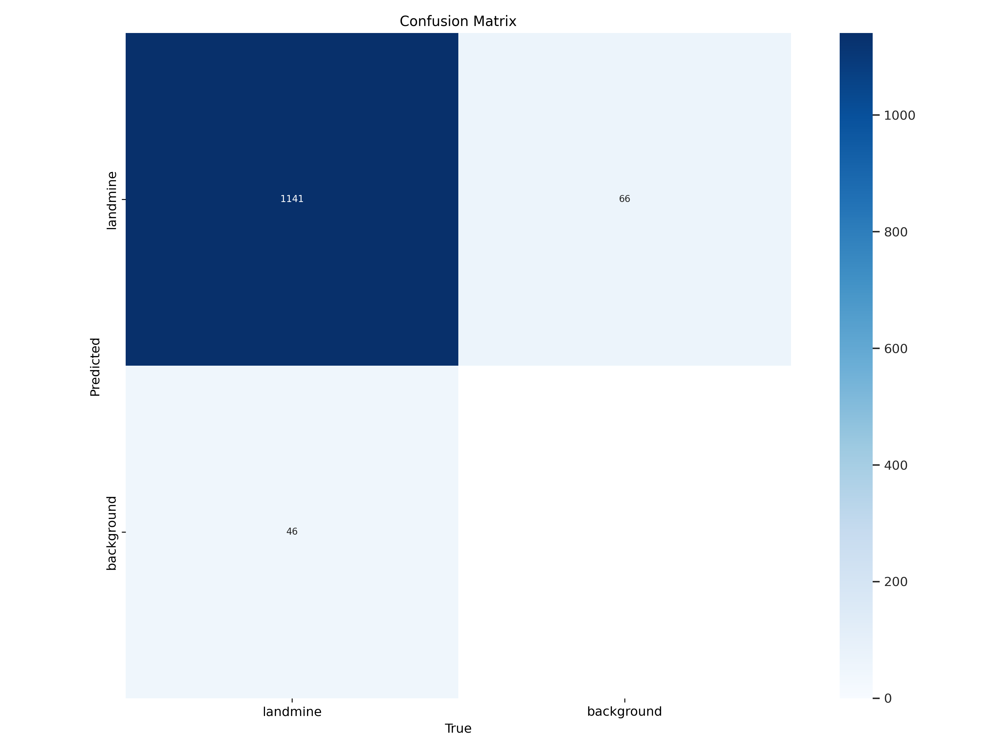

In [11]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

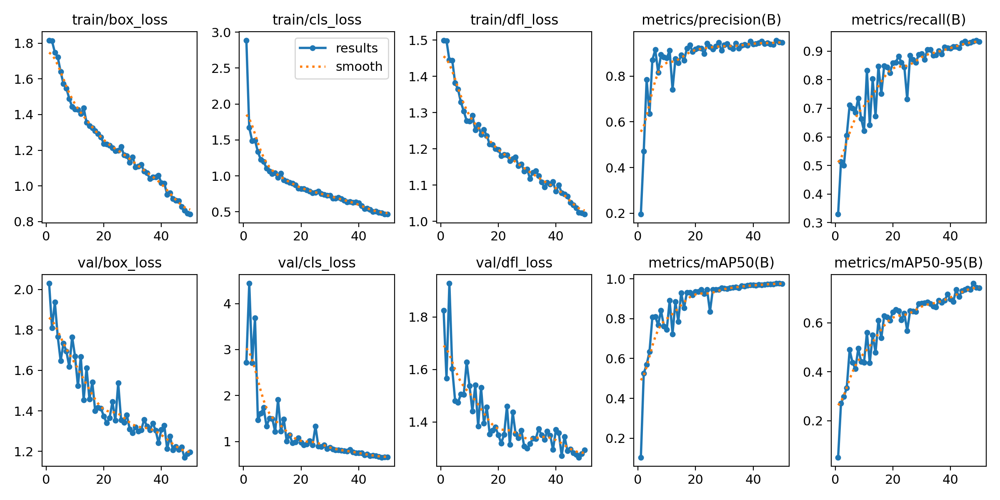

In [12]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train/results.png', width=600)

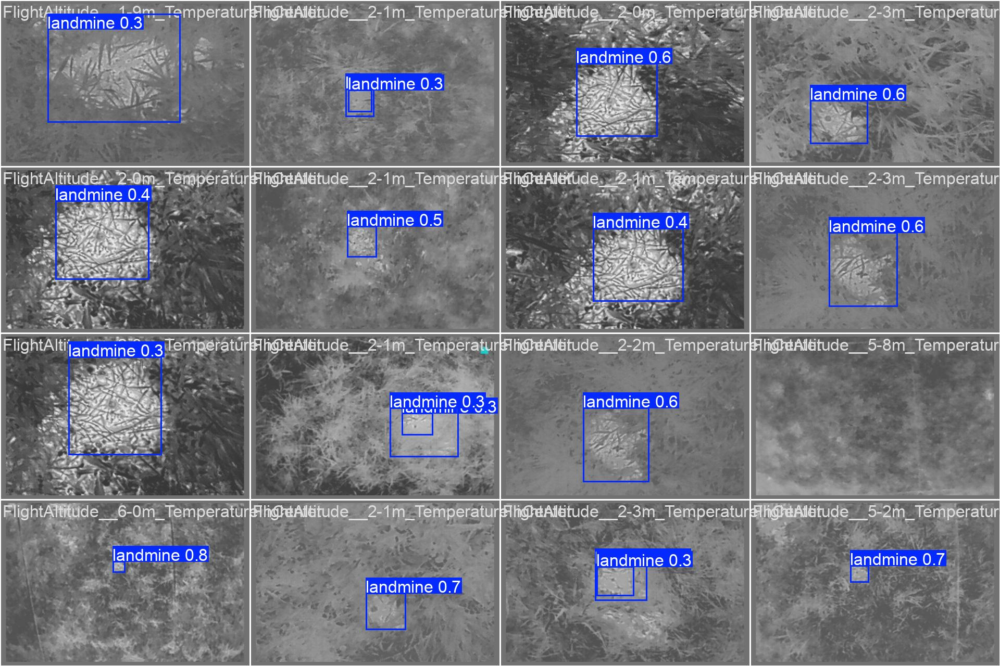

In [13]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

- Validation

In [14]:
!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data=MineGuard-Thermal-15/data.yaml

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs
val: Scanning /content/MineGuard-Thermal-15/valid/labels.cache... 607 images, 27 backgrounds, 0 corrupt: 100% 607/607 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 38/38 [00:11<00:00,  3.22it/s]
                   all        607       1187      0.955      0.936      0.977      0.763
Speed: 0.5ms preprocess, 7.9ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


- Inference

In [ ]:
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=MineGuard-Thermal-15/test/images save=True

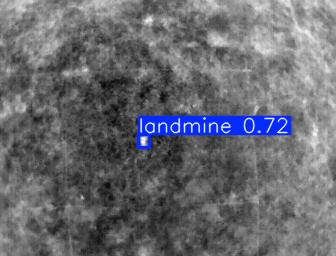

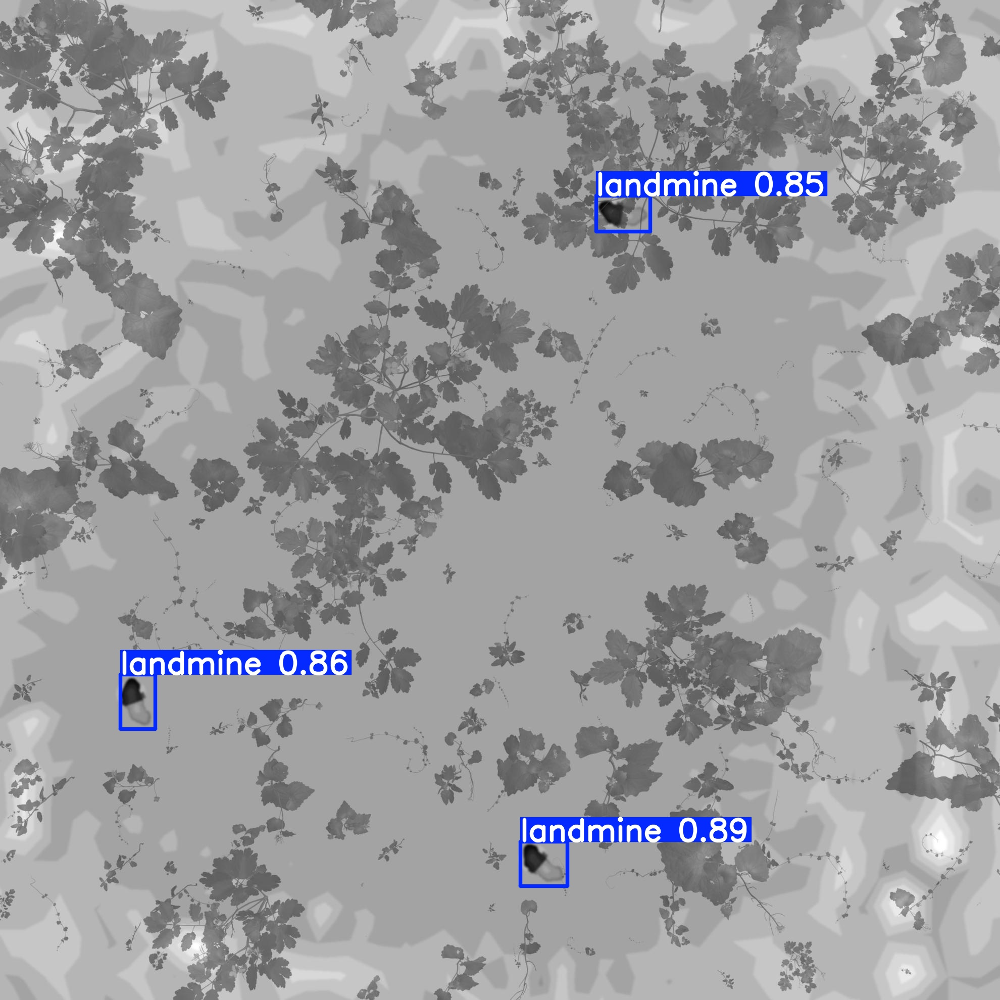

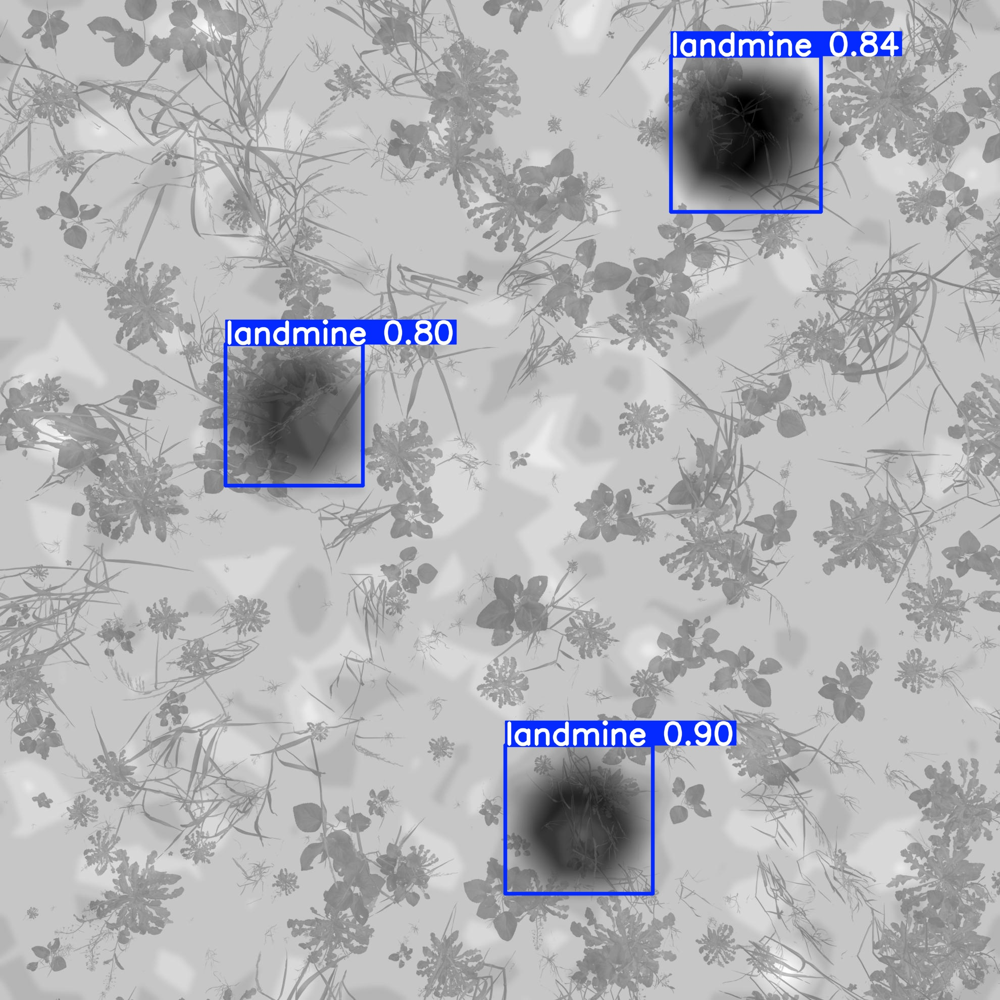

In [16]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[:3]:
    display(IPyImage(filename=img, width=600))
    print("\n")

###  Training Detectron2

- Installing

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

In [ ]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

- Getting and registering data

In [ ]:
!curl -L "https://universe.roboflow.com/ds/3hSU07q1uL?key=BvQoDA8yQT" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

- Training

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

- Evaluation

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

- Inference with Saved Weights

In [ ]:
%ls ./output/

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])


### Ensemble Learning

- Run prediction on test images with all models

In [ ]:
# YOLOv5 Prediction
!yolo task=detect mode=predict model=models/yoloV5_best.pt conf=0.25 source=data/test/images save=True

# YOLOv8 Prediction
!yolo task=detect mode=predict model=path_to_yolov8_weights/best.pt conf=0.25 source=MineGuard-Thermal-15/test/images save=True

# YOLOv11 Prediction
!yolo task=detect mode=predict model=models/yoloV11_best.pt conf=0.25 source=data/test/images save=True


- Getting outputs

In [ ]:
import glob

# Example for YOLOv5
yolov5_preds = glob.glob('path_to_yolov5_predictions/*.txt')
# Repeat for YOLOv7, YOLOv8, and YOLOv11

# Example for YOLOv8
yolov8_preds = glob.glob('path_to_yolov8_predictions/*.txt')

# Example for YOLOv11
yolov11_preds = glob.glob('path_to_yolov11_predictions/*.txt')

- Average prediction from each model

In [ ]:
import numpy as np
import os
from collections import defaultdict

def average_predictions(pred_files):
    # Implement logic to average predictions
    pass
    prediction_dict = defaultdict(list)

    for pred_file in pred_files:
      image_id = os.path.splitext(os.path.basename(pred_file))[0]
      with open(pred_file, 'r') as f:
        for line in f:
          parts = line.strip().split()
          if len(parts) != 6:
            continue
          class_id, conf, x, y, w, h = map(float, parts)
          prediction_dict[image_id].append({
            'class_id': class_id,
            'conf': conf,
            'bbox': [x, y, w, h]
          })

    averaged_predictions = {}

    for image_id, preds in prediction_dict.items():
      if not preds:
        continue
      # Group by class_id
      class_groups = defaultdict(list)
      for pred in preds:
        class_groups[pred['class_id']].append(pred)

      averaged_predictions[image_id] = []
      for class_id, group in class_groups.items():
        avg_conf = np.mean([p['conf'] for p in group])
        avg_bbox = np.mean([p['bbox'] for p in group], axis=0).tolist()
        averaged_predictions[image_id].append({
          'class_id': class_id,
          'conf': avg_conf,
          'bbox': avg_bbox
        })

    return averaged_predictions

- Smoother overalapping boxes

In [ ]:
import torch
from torchvision.ops import nms

def apply_nms(predictions, iou_threshold=0.5):
    filtered_predictions = {}

    for image_id, preds in predictions.items():
        filtered_predictions[image_id] = []
        # Group predictions by class_id
        class_groups = defaultdict(list)
        for pred in preds:
            class_groups[pred['class_id']].append(pred)

        for class_id, group in class_groups.items():
            boxes = []
            scores = []
            for pred in group:
                x, y, w, h = pred['bbox']
                x1 = x - w / 2
                y1 = y - h / 2
                x2 = x + w / 2
                y2 = y + h / 2
                boxes.append([x1, y1, x2, y2])
                scores.append(pred['conf'])

            boxes = torch.tensor(boxes)
            scores = torch.tensor(scores)

            keep = nms(boxes, scores, iou_threshold)

            for idx in keep:
                filtered_predictions[image_id].append(group[idx.item()])

    return filtered_predictions

- Get final output

In [ ]:
from collections import defaultdict
import numpy as np

def majority_voting(preds_list, vote_threshold=2):
    voted_predictions = defaultdict(list)

    for preds in preds_list:
        for image_id, objects in preds.items():
            for obj in objects:
                key = (obj['class_id'], tuple(obj['bbox']))
                voted_predictions[image_id].append(key)

    final_predictions = defaultdict(list)

    for image_id, detections in voted_predictions.items():
        counts = defaultdict(int)
        for det in detections:
            counts[det] += 1
        for det, count in counts.items():
            if count >= vote_threshold:
                final_predictions[image_id].append({
                    'class_id': det[0],
                    'conf': count,  # or another metric
                    'bbox': list(det[1])
                })

    return final_predictions

def weighted_voting(preds_list, weights):
    assert len(preds_list) == len(weights), "Number of prediction lists must match number of weights"

    weighted_predictions = defaultdict(lambda: defaultdict(lambda: {'conf_sum': 0.0, 'bbox_sum': np.zeros(4)}))

    for preds, weight in zip(preds_list, weights):
        for image_id, objects in preds.items():
            for obj in objects:
                key = (obj['class_id'], tuple(obj['bbox']))
                weighted_predictions[image_id][key]['conf_sum'] += obj['conf'] * weight
                weighted_predictions[image_id][key]['bbox_sum'] += np.array(obj['bbox']) * weight

    final_predictions = defaultdict(list)

    for image_id, detections in weighted_predictions.items():
        for det, values in detections.items():
            final_predictions[image_id].append({
                'class_id': det[0],
                'conf': values['conf_sum'],
                'bbox': (values['bbox_sum'] / weights[:len(values['bbox_sum'])]).tolist()
            })

    return final_predictions

- Save the new file

In [ ]:
import os

def save_predictions(predictions, save_path):
    os.makedirs(save_path, exist_ok=True)

    for image_id, preds in predictions.items():
        file_path = os.path.join(save_path, f"{image_id}.txt")
        with open(file_path, 'w') as f:
            for pred in preds:
                class_id = pred['class_id']
                conf = pred['conf']
                x, y, w, h = pred['bbox']
                line = f"{int(class_id)} {conf:.6f} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n"
                f.write(line)

- Get the metrics of the updated columns

In [ ]:
import json
from collections import defaultdict
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

def calculate_metrics(ground_truths, predictions, iou_threshold=0.5):
    """
    Calculate Precision, Recall, and mAP using COCO evaluation.

    Args:
        ground_truths (dict): Ground truth annotations.
        predictions (dict): Predicted annotations.
        iou_threshold (float): IoU threshold for evaluation.

    Returns:
        dict: Dictionary containing Precision, Recall, and mAP.
    """
    # Convert ground truths to COCO format
    coco_gt = {
        "images": [],
        "annotations": [],
        "categories": []
    }
    coco_pred = []

    annotation_id = 1
    category_set = set()

    for image_id, objs in ground_truths.items():
        coco_gt["images"].append({
            "id": image_id,
            "file_name": f"{image_id}.jpg"
        })
        for obj in objs:
            category_set.add(int(obj['class_id']))
            coco_gt["annotations"].append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": int(obj['class_id']),
                "bbox": obj['bbox'],
                "iscrowd": 0
            })
            annotation_id += 1

    # Define categories
    coco_gt["categories"] = [{"id": int(cat_id), "name": f"class_{cat_id}"} for cat_id in sorted(category_set)]

    # Convert predictions to COCO format
    for image_id, objs in predictions.items():
        for obj in objs:
            coco_pred.append({
                "image_id": image_id,
                "category_id": int(obj['class_id']),
                "bbox": obj['bbox'],
                "score": float(obj['conf'])
            })

    # Save ground truths and predictions to temporary JSON files
    with open('temp_gt.json', 'w') as f:
        json.dump(coco_gt, f)

    with open('temp_pred.json', 'w') as f:
        json.dump(coco_pred, f)

    # Load COCO ground truth and predictions
    coco_gt = COCO('temp_gt.json')
    coco_dt = coco_gt.loadRes('temp_pred.json')

    # Initialize COCOeval
    coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')
    coco_eval.params.iouThrs = [iou_threshold]
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

    # Extract metrics
    metrics = {
        "Average Precision (AP)": coco_eval.stats[0],
        "Average Recall (AR)": coco_eval.stats[8]
    }

    return metrics

### Transfer Learning

### Trying Data Augmentation

### Instance Segmentation Models

### Multi-Modal Data

In [17]:
# prompt: Write code to download the entire folder located at /content/runs/detect

import shutil
import os

# Define the source folder
source_folder = '/content/runs/detect'

# Define the destination folder (you can change this)
destination_folder = '/content/drive/MyDrive/landmine_detection/results/yolov11'

# Create the destination folder if it doesn't exist
os.makedirs(destination_folder, exist_ok=True)

# Copy the entire folder and its contents
shutil.copytree(source_folder, destination_folder, dirs_exist_ok=True)

print(f"Folder '{source_folder}' copied to '{destination_folder}'")

Folder '/content/runs/detect' copied to '/content/drive/MyDrive/landmine_detection/results/yolov11'
